In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from datetime import datetime
import folium

from tqdm import tqdm_notebook
from glob import glob
from tqdm.auto import tqdm
import pickle

import CaGeo.algorithms.SegmentFeatures as sf

In [2]:
with open("Data/Not_Resampled/FIXED_not_resample_10km_LCSS/model.pkl", "rb") as fd:
#with open("Data/Not_Resampled/FIXED_sum_not_resample_10km__rot_euc/model.pkl", "rb") as fd:
    geolet = pickle.load(fd)

In [3]:
import CaGeo.algorithms.BasicFeatures as bf
import CaGeo.algorithms.AggregateFeatures as af
import CaGeo.algorithms.SegmentFeatures as sf
from shapely.geometry import LineString
from shapely.ops import unary_union, polygonize

def count_self_intersections(latitudes, longitudes):
    line = LineString(zip(longitudes, latitudes))
    multi_line = unary_union(line)
    intersections = list(polygonize(multi_line))
    return len(intersections)

additional_features = {
    "avg_speed": lambda x: np.mean(bf.speed(lat=x.latitude, lon=x.longitude, time=x.time)*3600),
    "std_accel": lambda x: np.mean(bf.acceleration(lat=x.latitude, lon=x.longitude, time=x.time)*3600),
    #"std_accel2": lambda x: np.mean(bf.acceleration2(lat=x.latitude, lon=x.longitude, time=x.time)*3600),
    "distance_sum": lambda x: np.sum(bf.distance(lat=x.latitude, lon=x.longitude, accurate=False)),
    "distance_std": lambda x: np.std(bf.distance(lat=x.latitude, lon=x.longitude, accurate=False)),
    "start2end_distance": lambda x: np.sum(bf.distance(lat=np.array([x.latitude[1], x.latitude[-1]]), 
                                                       lon=np.array([x.longitude[1], x.longitude[-1]])*3600, accurate=False)),

    "straightness": lambda x: sf.straightness(lat=x.latitude, lon=x.longitude),
    "meanSquaredDisplacement": lambda x: sf.meanSquaredDisplacement(lat=x.latitude, lon=x.longitude),
    "sinuosity": lambda x: sf.sinuosity(lat=x.latitude, lon=x.longitude),
    "intensityUse": lambda x: sf.intensityUse(lat=x.latitude, lon=x.longitude),

    "intersections": lambda x: count_self_intersections(x.latitude, x.longitude),
}

In [4]:
new_data = dict()
for feature_name, feature_function in tqdm(additional_features.items(), position=0):
    res_list = []
    
    for shapelet in tqdm(geolet.candidate_geolets.values(), position=1, leave=False):
        res_list.append(feature_function(shapelet))

    new_data[feature_name] = res_list

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

In [5]:
df_features = pd.DataFrame.from_dict(new_data)

df_features.describe()

,avg_speed,std_accel,distance_sum,distance_std,start2end_distance,straightness,meanSquaredDisplacement,sinuosity,intensityUse,intersections
count,6159.000000,6.159000e+03,6159.000000,6159.000000,6159.000000,6159.000000,6.159000e+03,6159.000000,6159.000000,6159.000000
mean,10.900524,1.223086e+00,7.824716,0.574452,5017.934184,0.850140,7.669285e-04,1.363377,226.905658,343.990745
std,5.379766,1.119611e+00,2.896077,0.765671,3000.447314,0.260310,5.650673e-04,2.941067,342.876509,6756.564599
min,0.000045,3.482001e-10,0.002410,0.000318,0.000000,0.000793,5.874176e-11,0.011147,127.855309,0.000000
25%,5.640760,3.576723e-01,6.231306,0.032886,2336.636183,0.831151,3.063174e-04,0.640419,136.153014,0.000000
50%,12.118063,1.001787e+00,9.510156,0.277643,5366.788790,0.992391,6.883362e-04,0.820998,167.947503,0.000000
75%,15.611918,1.704742e+00,9.950986,0.790660,7698.898457,0.998938,1.140149e-03,1.195271,242.972855,0.000000
max,23.908791,1.632304e+01,9.997699,4.696528,9692.498993,1.000000,4.227449e-03,79.611819,21994.290103,312323.000000


In [6]:
len(geolet.candidate_geolets)

6159

In [7]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_features_scaled = pd.DataFrame(scaler.fit_transform(df_features), columns=df_features.columns)
df_features_scaled.describe()

,avg_speed,std_accel,distance_sum,distance_std,start2end_distance,straightness,meanSquaredDisplacement,sinuosity,intensityUse,intersections
count,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03,6.159000e+03
mean,1.476692e-16,1.292106e-16,-5.076129e-17,-5.537596e-17,1.199812e-16,1.292106e-16,2.953384e-16,-1.153666e-17,4.153197e-17,-6.921995e-18
std,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00,1.000081e+00
min,-2.026364e+00,-1.092509e+00,-2.701220e+00,-7.499053e-01,-1.672531e+00,-3.263098e+00,-1.357344e+00,-4.598125e-01,-2.889040e-01,-5.091621e-02
25%,-9.777732e-01,-7.730221e-01,-5.502405e-01,-7.073662e-01,-8.937053e-01,-7.295172e-02,-8.152100e-01,-2.458347e-01,-2.647018e-01,-5.091621e-02
50%,2.263367e-01,-1.976733e-01,5.820208e-01,-3.876767e-01,1.162770e-01,5.465152e-01,-1.390960e-01,-1.844305e-01,-1.719655e-01,-5.091621e-02
75%,8.758331e-01,4.302338e-01,7.342495e-01,2.824001e-01,8.935941e-01,5.716659e-01,6.605418e-01,-5.716273e-02,4.686381e-02,-5.091621e-02
max,2.418195e+00,1.348788e+01,7.503805e-01,5.384052e+00,1.558082e+00,5.757474e-01,6.124584e+00,2.660762e+01,6.348977e+01,4.617796e+01


In [8]:
from sklearn.cluster import AgglomerativeClustering

ac = AgglomerativeClustering(n_clusters=10**2).fit(df_features_scaled.values)

In [9]:
ac.labels_

array([23,  5, 16, ..., 45, 11, 38])

In [10]:
df_features.iloc[np.where(ac.labels_==0)].mean().values

array([8.26844666e+00, 8.70418414e-01, 9.91749062e+00, 7.26729112e-02,
       6.33371319e+03, 9.79808864e-01, 1.33434008e-03, 6.78320527e-01,
       2.49799203e+02, 5.37634409e-02])

In [11]:
centroids = []

for idx in np.unique(ac.labels_):
    df_features_sub = df_features.iloc[np.where(ac.labels_==idx)]
    centroids.append(df_features_sub.mean().values)

medoids = []
for centroid in centroids:
    df_features_sub = np.abs(np.copy(df_features.values) - centroid)
    medoids.append((np.argmin(df_features_sub.sum(axis=1)), df_features_sub[np.argmin(df_features_sub.sum(axis=1))]))

In [12]:
import plotly.express as px
df_viz = pd.DataFrame([x[1] for x in medoids], columns=df_features.columns).reset_index()
df_viz.intersections = np.log2(1+df_viz.intersections)
df_viz.start2end_distance = np.log2(1+df_viz.start2end_distance)
fig = px.parallel_coordinates(df_viz, color="index",
                              dimensions=df_viz.drop(columns='index').columns,
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

In [13]:
geolets = geolet.candidate_geolets
geolets_keys = np.array(list(geolets.keys()))
dist_matrix = 1+geolet.selector.dist_matrix
np.fill_diagonal(dist_matrix, 0)

In [14]:
dist_matrix[0, 0]

0.0

In [15]:
dist_matrix[0, 0]

0.0

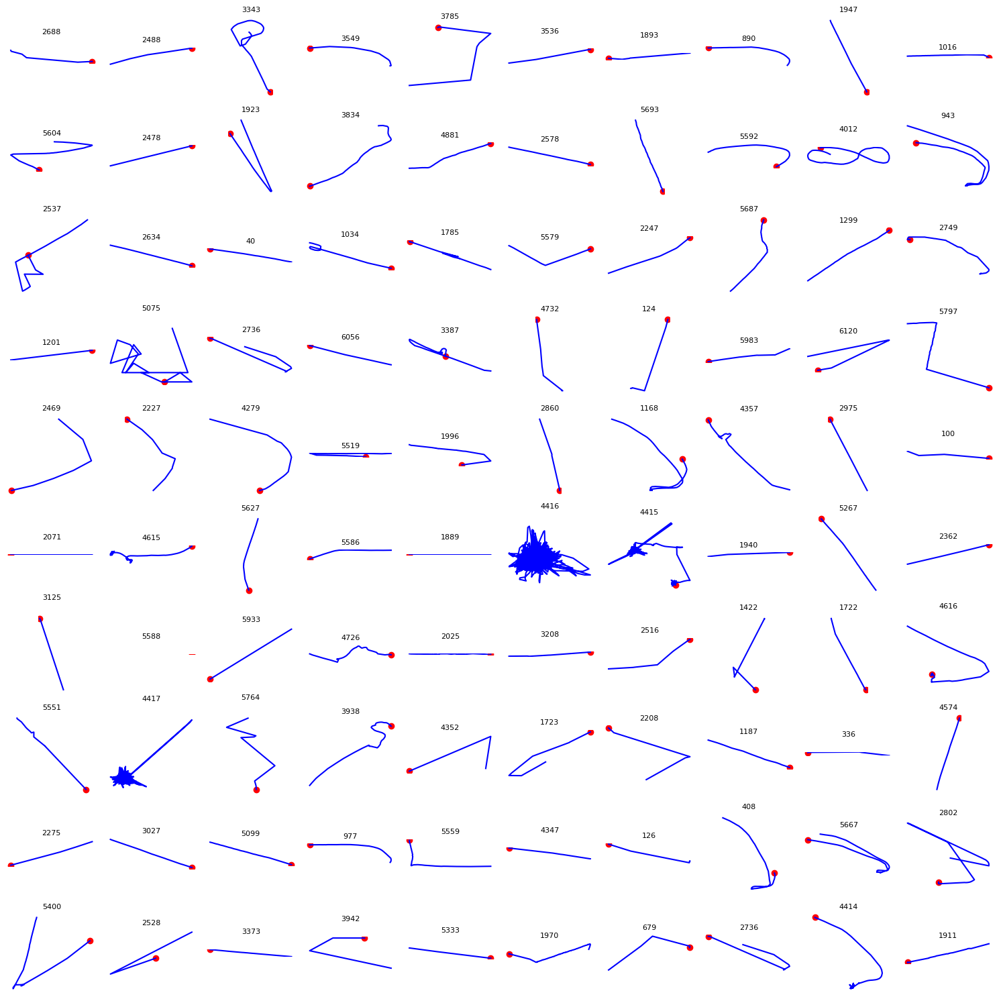

In [16]:
import math

fig, axes = plt.subplots(math.ceil(len(medoids)**.5), math.ceil(len(medoids)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, (geolet_id, _) in zip(axes, medoids):
    geolet_data = geolets[geolets_keys[geolet_id]]
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue')
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id, fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

In [17]:
from scipy.spatial.distance import cdist

sub_row_index = [x[0] for x in medoids]

#dist_matrix_sub = dist_matrix[np.ix_(sub_row_index, sub_row_index)]
dist_matrix_sub = dist_matrix[:, sub_row_index]

dist_matrix_optics = cdist(dist_matrix_sub, dist_matrix_sub, metric='minkowski', p=2)

dist_matrix_sub.shape

(6159, 100)

In [18]:
dist_matrix[4012].argsort()[::]

array([4012, 3956, 3933, ..., 1757, 4756, 2899])

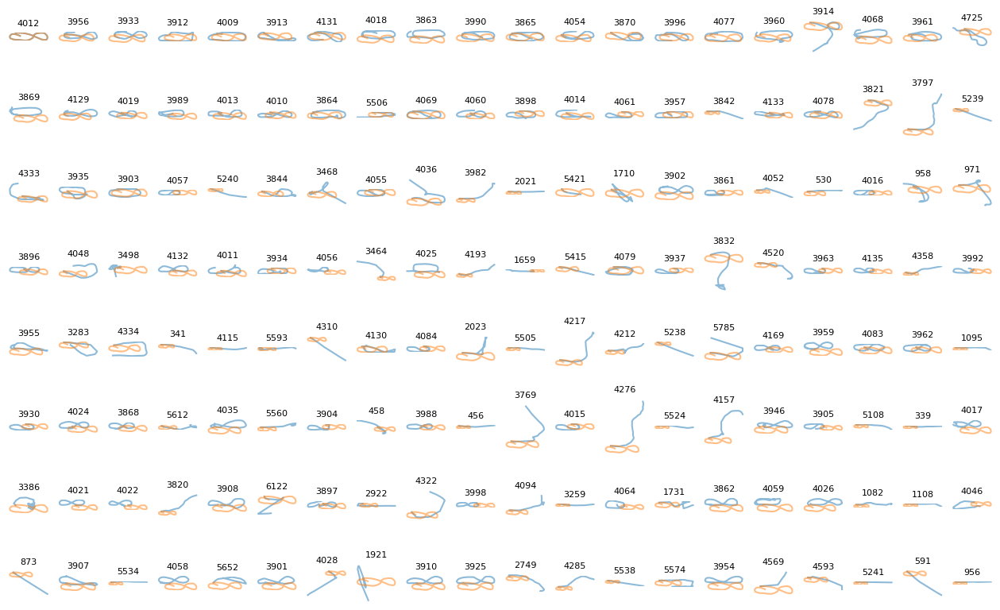

In [19]:
n_plot = 160
n_rows_img = math.ceil(n_plot/8)
fig, axes = plt.subplots(8, n_rows_img, figsize=(8*2, n_rows_img//2))
axes = axes.flatten()

for ax, idx in zip(axes, dist_matrix[4012].argsort()[::][:n_plot]):
    ax.plot(geolets[geolets_keys[idx]].longitude-geolets[geolets_keys[idx]].longitude[0], 
             geolets[geolets_keys[idx]].latitude-geolets[geolets_keys[idx]].latitude[0], alpha=.5)
    ax.plot(geolets[geolets_keys[4012]].longitude-geolets[geolets_keys[4012]].longitude[0], 
             geolets[geolets_keys[4012]].latitude-geolets[geolets_keys[4012]].latitude[0], alpha=.5)
    ax.set_title(idx, fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

In [20]:
from sklearn.cluster import OPTICS

op = OPTICS(n_jobs=20, metric='precomputed')
op_result = op.fit_predict(dist_matrix_optics)

/home/clandi/Andrienko/.venv/lib/python3.12/site-packages/sklearn/cluster/_optics.py:1086: RuntimeWarning:

divide by zero encountered in divide



In [21]:
len(np.unique(op_result))

126

In [22]:
medoids_optics = dict()

intra_cluster_distance = np.zeros((len(dist_matrix_optics),))
for idx, label in enumerate(op_result):
    intra_cluster_distance[idx] = np.sum(dist_matrix_optics[idx][op_result == label])

for label in tqdm(np.unique(op_result), desc="Collecting medoids"):
    min_idx = np.argmin(intra_cluster_distance[op_result == label])
    key = geolets_keys[op_result == label][min_idx]
    medoids_optics[f"cl={label}_{key}"] = geolets[key]
    scores = intra_cluster_distance[op_result == label][min_idx]

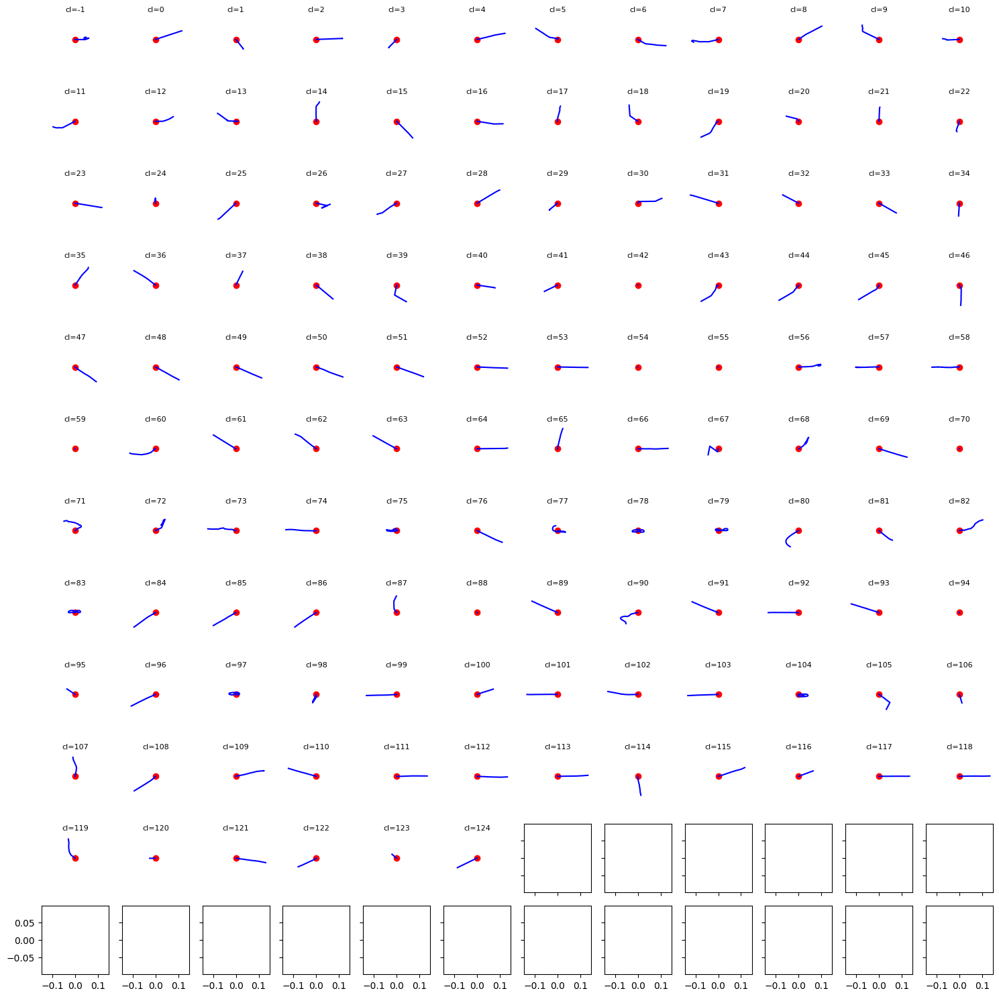

In [23]:
fig, axes = plt.subplots(math.ceil(len(medoids_optics)**.5), math.ceil(len(medoids_optics)**.5), figsize=(15, 15), 
                         sharex=True, sharey=True)
axes = axes.flatten()

for ax, (geolet_id, geolet_data) in zip(axes, medoids_optics.items()):
    ax.plot(geolet_data.longitude - geolet_data.longitude[0], 
            geolet_data.latitude - geolet_data.latitude[0], 
            color='blue')
    ax.scatter([0], 
               [0], 
               color='red')
    ax.set_title(geolet_id.split("_")[0], fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

## Rotation, scale and position invariant 

In [24]:
from PIL import Image, ImageDraw

def draw_image(lines, resolution="auto", padding=10, verbose=False):
    if type(lines) != np.ndarray:
        lines = np.array(lines)

    min_x, max_x = lines[:, ::2].min(), lines[:, ::2].max()
    min_y, max_y = lines[:, 1::2].min(), lines[:, 1::2].max()

    if verbose:
        print(min_x, max_x, min_y, max_y, '\r\n', resolution)

    image = Image.new("1", resolution, "black")
    draw = ImageDraw.Draw(image)

    scale_x = (resolution[0] - 2 * padding) / (max_x - min_x)
    scale_y = (resolution[1] - 2 * padding) / (max_y - min_y)

    scale = min(scale_x, scale_y)

    for line in lines:
        line = (
            int((line[0] - min_x) * scale + padding),
            int((line[1] - min_y) * scale + padding),
            int((line[2] - min_x) * scale + padding),
            int((line[3] - min_y) * scale + padding)
        )
        if verbose:
            print(line)
        draw.line(line, fill="white", width=1)

    return image

In [25]:
imgs = dict()

for geolet_id, geolet_data in tqdm(geolets.items()):
    lines = [(x1, y1, x2, y2) for x1, x2, y1, y2 in zip(geolet_data.longitude[:-1], geolet_data.longitude[1:], 
                                                        geolet_data.latitude[:-1], geolet_data.latitude[1:])]
    img = draw_image(lines, (320, 320), verbose=False)
    imgs[geolet_id] = (lines, img)

  0%|          | 0/6159 [00:00<?, ?it/s]

In [26]:
from skimage.transform import hough_line
import scipy

angle_step = 1
tested_angles = np.linspace(-np.pi / 2, np.pi / 2, int(180 / angle_step), endpoint=False)

fft_imgs = dict()

for geolet_id, (lines, img) in tqdm(imgs.items()):
    h, theta, d = hough_line(np.array(img), theta=tested_angles)
    h = np.log(1 + h)
    h_sum = h.sum(axis=0)
    fft = np.abs(scipy.fft.fft(h_sum))
    fft_imgs[geolet_id] = (lines, img, h, h_sum, fft)

  0%|          | 0/6159 [00:00<?, ?it/s]

In [87]:
from matplotlib import cm

def print_accumulator(angle_step, h, theta, d, ax):
    angle_step = 0.5 * np.diff(theta).mean()
    d_step = 0.5 * np.diff(d).mean()
    bounds = [np.rad2deg(theta[0] - angle_step),
              np.rad2deg(theta[-1] + angle_step),
              d[-1] + d_step, d[0] - d_step]
    
    ax.imshow(np.log(1 + h), 
              extent=bounds, 
              cmap=cm.gray, 
              aspect=1 /2
             )
    ax.set_title('Hough Accumulator H')
    ax.set_xlabel('Angles (degrees)')
    ax.set_ylabel('Distance (pixels)')
    return ax

In [142]:
from PIL import ImageOps

def plot_trj2img_steps(fft_imgs, geolet_key):
    lines, img, h, h_sum, fft = fft_imgs[geolet_key]

    fig, axes = plt.subplots(1, 4, figsize=(15, 3))
    
    axes[0].imshow(ImageOps.invert(img))
    axes[0].axis('off')
    axes[0].set_title('Trajectory')
    
    print_accumulator(angle_step, h, theta, d, axes[1])
    
    axes[2].plot(np.max(h_sum)-h_sum)
    axes[2].set_title("sum_col(H)")
    axes[2].set_ylim(0, 220)
    
    axes[3].plot(np.log2(fft))
    axes[3].set_title("FFT(sum_col(H))")
    axes[3].set_ylim(0, 17)

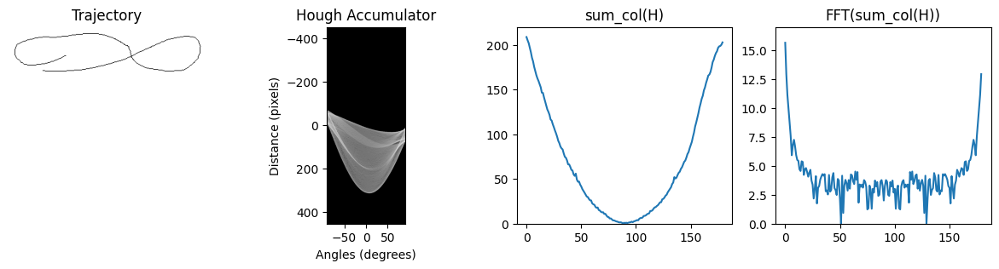

In [143]:
plot_trj2img_steps(fft_imgs, '265_228109000')

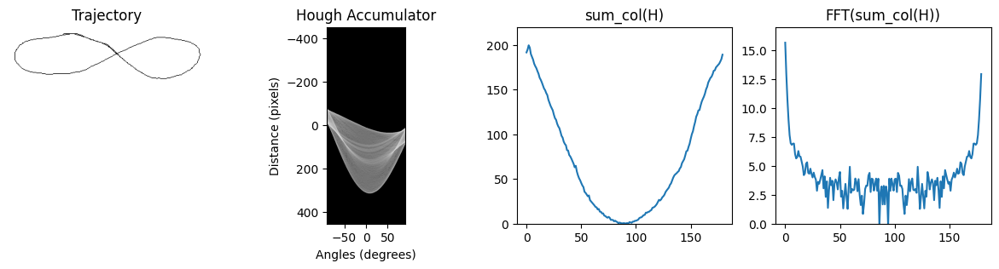

In [144]:
plot_trj2img_steps(fft_imgs, geolets_keys[3868])

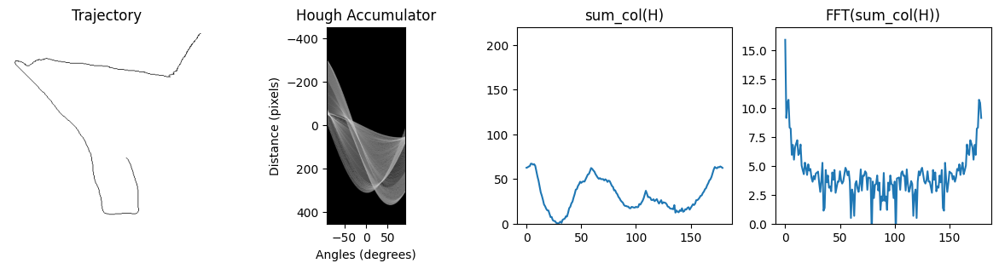

In [145]:
plot_trj2img_steps(fft_imgs, geolets_keys[5466])

In [27]:
def find_nearest(arr, idx, k=1):
    dists = np.linalg.norm(arr - arr[idx], axis=1)
    dists[idx] = np.inf

    return np.argsort(dists)[:k]

In [28]:
dist_matrix_img_fft = np.vstack([fft for geoelt_id, (lines, img, h, h_sum, fft) in tqdm(fft_imgs.items())])
dist_matrix_img_h = np.vstack([h.flatten() for geoelt_id, (lines, img, h, h_sum, fft) in tqdm(fft_imgs.items())])
dist_matrix_img_h_sum = np.vstack([h_sum for geoelt_id, (lines, img, h, h_sum, fft) in tqdm(fft_imgs.items())])

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

  0%|          | 0/6159 [00:00<?, ?it/s]

In [29]:
print(dist_matrix_img_fft.shape)
print(dist_matrix_img_h.shape)
print(dist_matrix_img_h_sum.shape)

(6159, 180)
(6159, 163260)
(6159, 180)


In [30]:
geolets_keys[4012]

'265_228109000'

In [32]:
find_nearest(dist_matrix_img_fft, 4012, k=10)

array([4063, 3937, 3992, 4170, 4061, 3448, 4013, 3860, 4060, 4129])

In [33]:
geolets_keys[3992]

'244_228109000'

  0%|          | 0/100 [00:00<?, ?it/s]

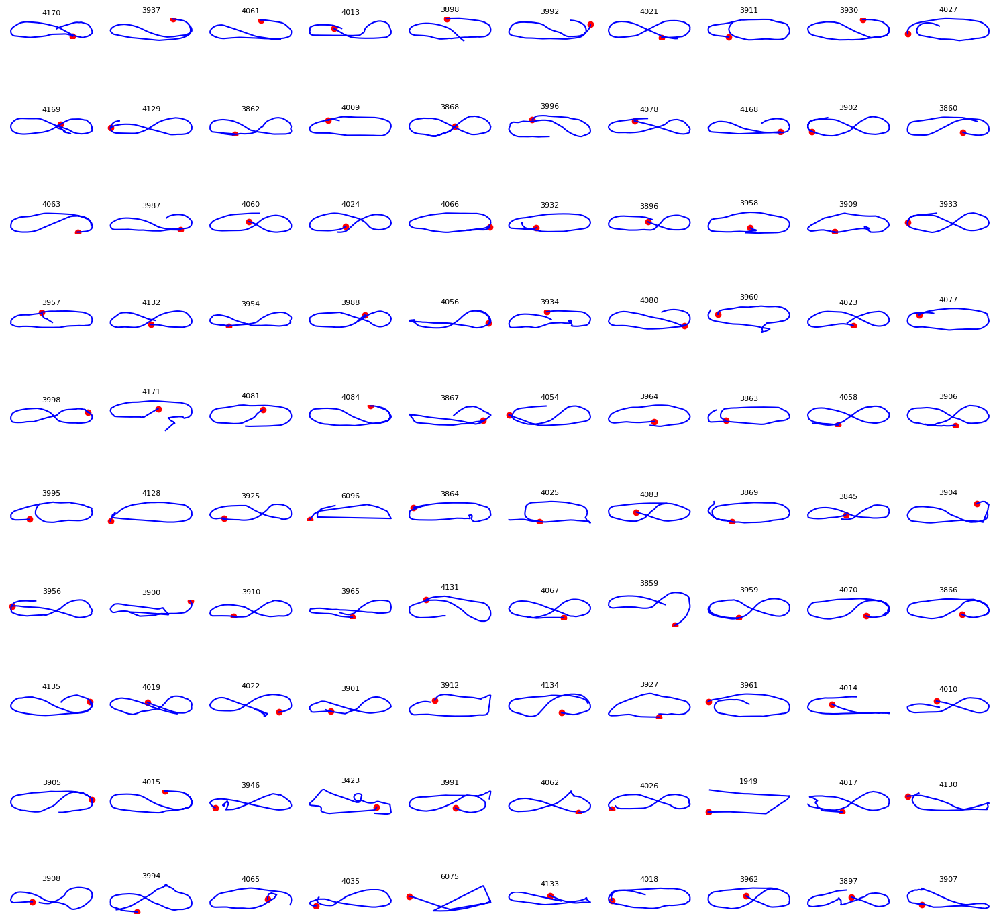

In [101]:
nearest = find_nearest(dist_matrix_img_h_sum, 4012, k=100)

fig, axes = plt.subplots(math.ceil(len(nearest)**.5), math.ceil(len(nearest)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, pos in zip(axes, tqdm(nearest)):
    geolet_id = geolets_keys[pos]
    geolet_data = geolets[geolet_id]
    ax.plot(geolet_data.longitude - geolet_data.longitude[0], 
            geolet_data.latitude - geolet_data.latitude[0], 
            color='blue')
    ax.scatter([0], 
               [0], 
               color='red')
    ax.set_title(pos, fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

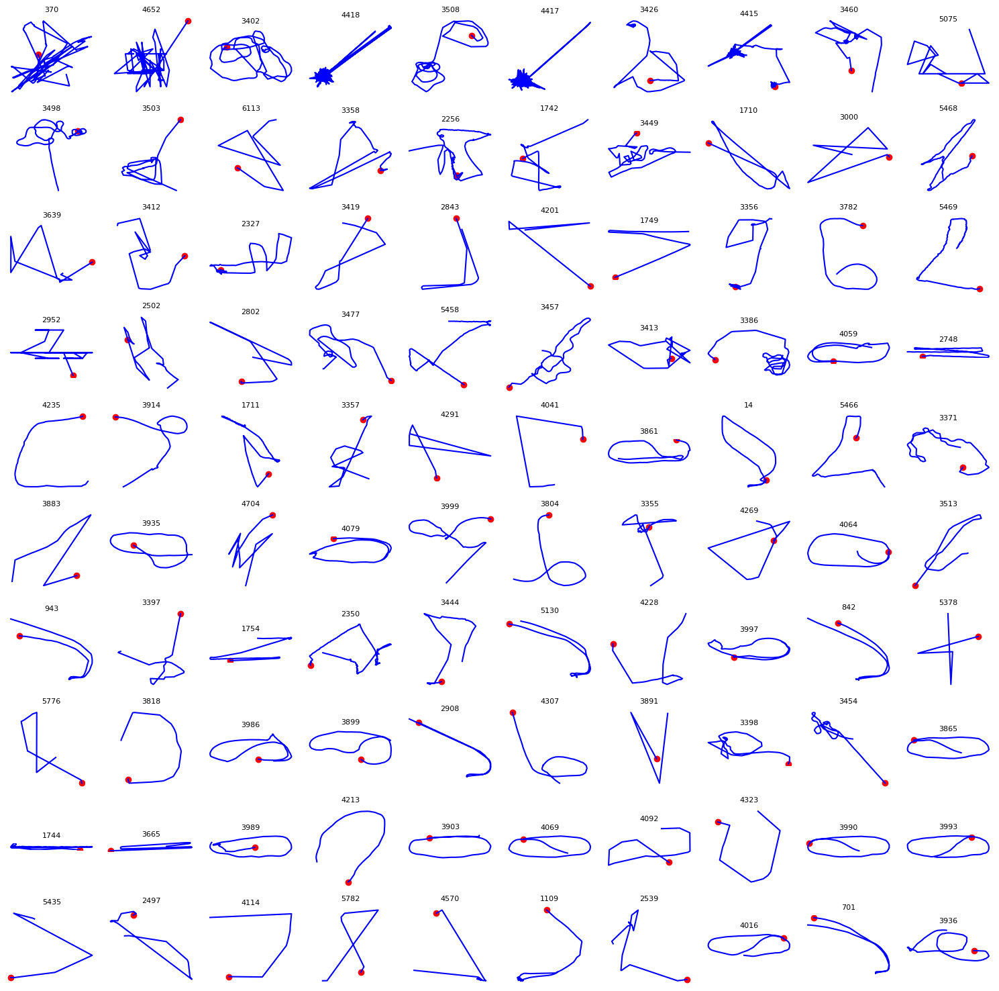

In [103]:
nearest = find_nearest(dist_matrix_img_h_sum, 4416, k=100)

fig, axes = plt.subplots(math.ceil(len(nearest)**.5), math.ceil(len(nearest)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, pos in zip(axes, tqdm(nearest)):
    geolet_id = geolets_keys[pos]
    geolet_data = geolets[geolet_id]
    ax.plot(geolet_data.longitude - geolet_data.longitude[0], 
            geolet_data.latitude - geolet_data.latitude[0], 
            color='blue')
    ax.scatter([0], 
               [0], 
               color='red')
    ax.set_title(pos, fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

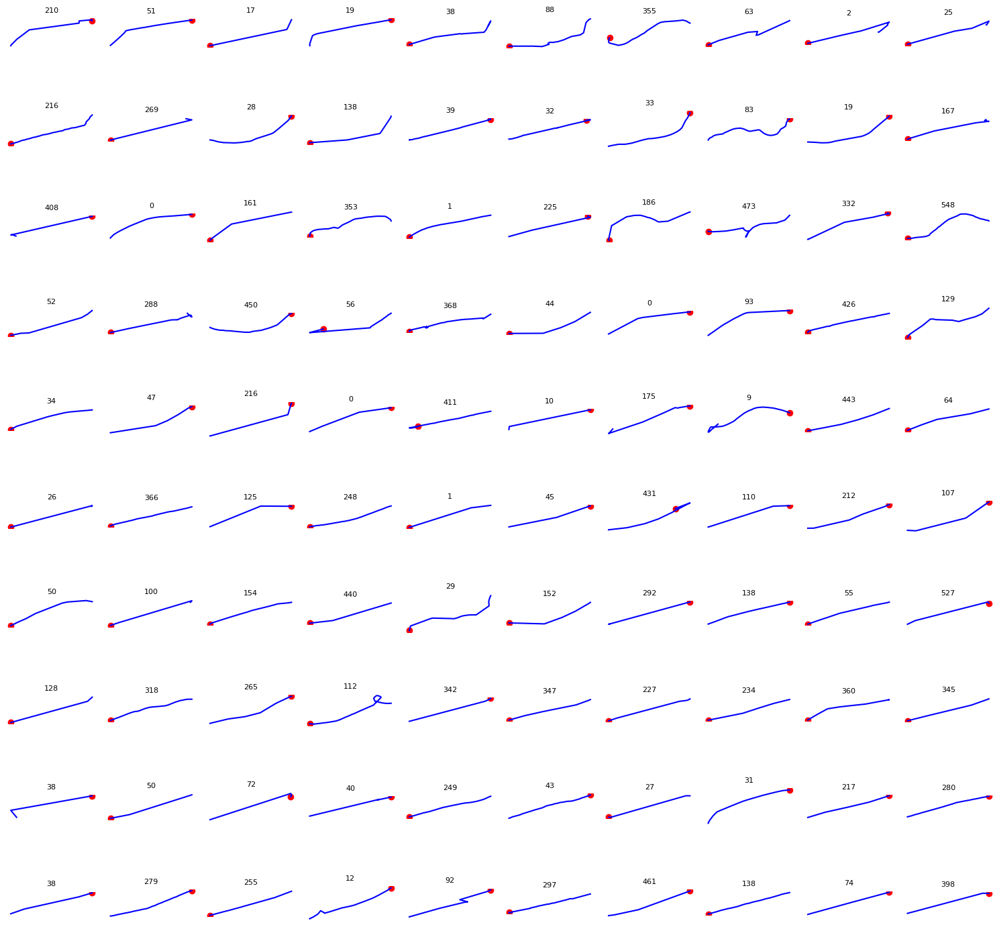

In [43]:
nearest = find_nearest(dist_matrix_img_h_sum, 4193, k=100)

fig, axes = plt.subplots(math.ceil(len(nearest)**.5), math.ceil(len(nearest)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, pos in zip(axes, tqdm(nearest)):
    geolet_id = geolets_keys[pos]
    geolet_data = geolets[geolet_id]
    ax.plot(geolet_data.longitude - geolet_data.longitude[0], 
            geolet_data.latitude - geolet_data.latitude[0], 
            color='blue')
    ax.scatter([0], 
               [0], 
               color='red')
    ax.set_title(geolet_id.split("_")[0], fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

## TEST dist_matrix_img clu

  0%|          | 0/11 [00:00<?, ?it/s]

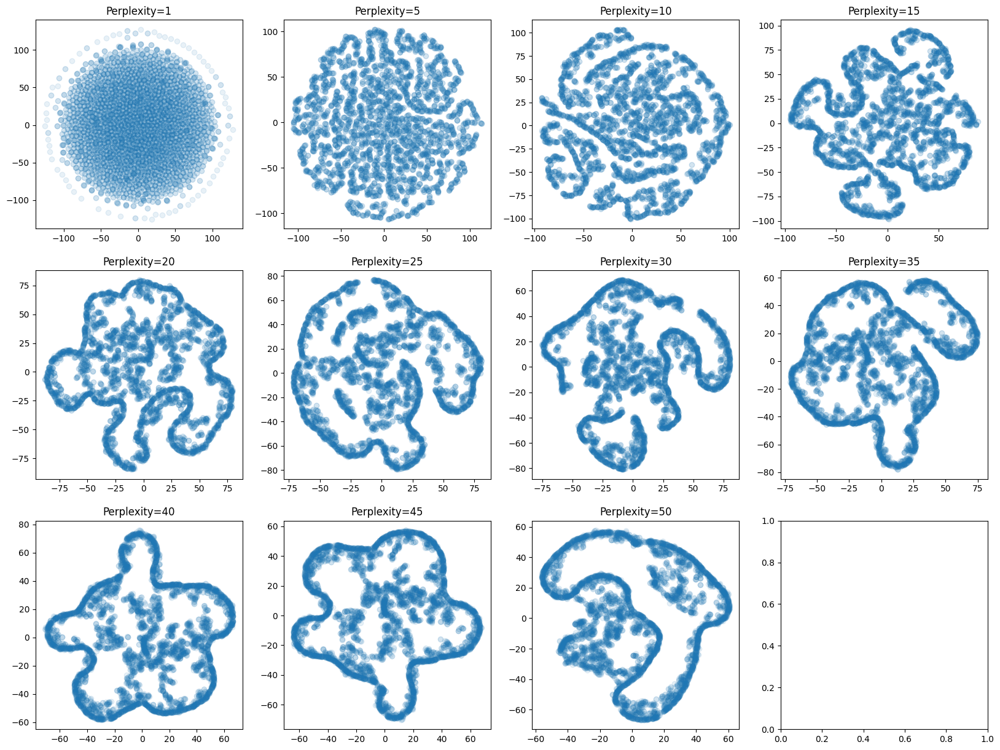

In [42]:
from sklearn.manifold import TSNE

_, axs = plt.subplots(3, 4, figsize=(20, 15))
axs = axs.flatten()

for ax, perplexity in zip(axs, tqdm(range(0, 50+1, 5))):
    tsne = TSNE(n_components=2, init="random", n_jobs=128, perplexity=max(1, perplexity))

    tsne_projection = tsne.fit_transform(dist_matrix_img_h_sum)
    
    ax.scatter(tsne_projection[:, 0], tsne_projection[:, 1], alpha=.1)
    ax.set_title(f'Perplexity={max(1, perplexity)}')

plt.show()

  0%|          | 0/9 [00:00<?, ?it/s]

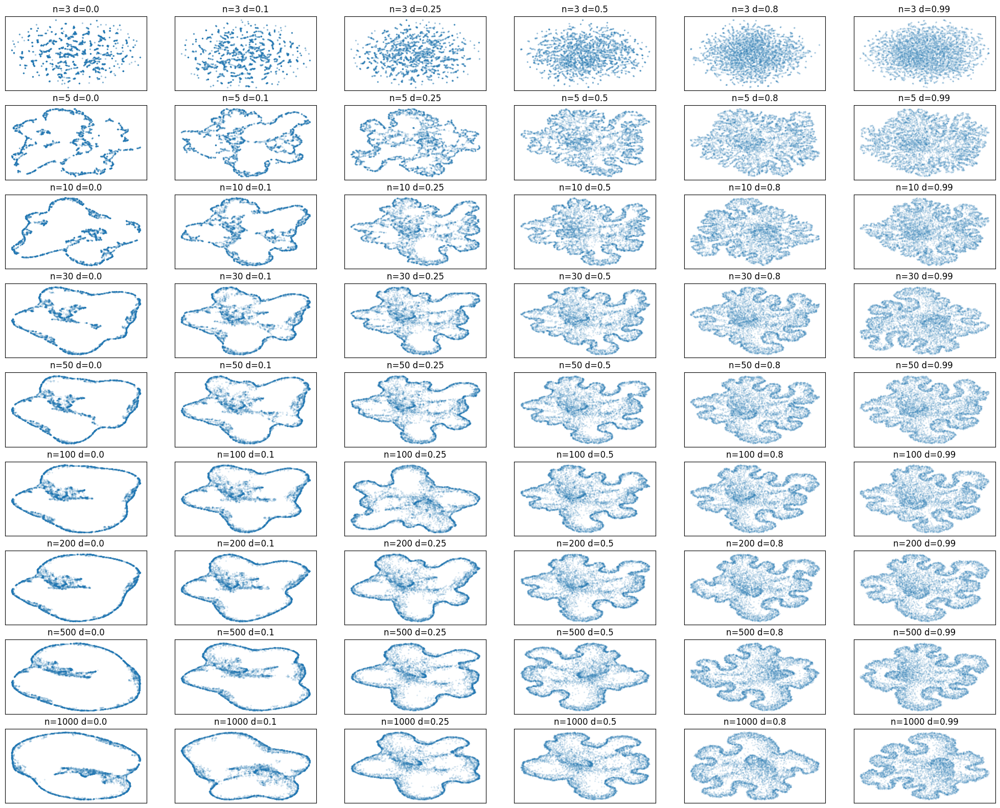

In [180]:
#pip install umap-learn
import umap
import warnings
warnings.filterwarnings("ignore")

n_neighbors_list = [3, 5, 10, 30, 50, 100, 200, 500, 1000]
min_dist_list = [0.0, 0.1, 0.25, 0.5, 0.8, 0.99]

_, axs = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(25, 20))

for i, n_neighbors in enumerate(tqdm(n_neighbors_list)):
    for j, min_dist in enumerate(min_dist_list):
        reducer = umap.UMAP(n_neighbors=n_neighbors, n_components=2, min_dist=min_dist)
        embedding = reducer.fit_transform(dist_matrix_img_h_sum)
        axs[i, j].scatter(embedding[:, 0], embedding[:, 1], alpha=.1, s=2)
        axs[i, j].set_title(f'n={n_neighbors} d={min_dist}')
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

plt.show()

In [181]:
op_res_img = OPTICS(n_jobs=30).fit_predict(dist_matrix_img_h_sum)

len(np.unique(op_res_img))

145

In [182]:
op_res_img

array([ 0, -1, -1, ..., -1, -1, -1])

In [183]:
centroids = []

for idx in np.unique(op_res_img):
    df_features_sub = dist_matrix_img_h_sum[np.where(op_res_img==idx)]
    centroids.append(np.mean(df_features_sub, axis=0))

medoids = []
for centroid in centroids:
    df_features_sub = np.abs(np.copy(dist_matrix_img_h_sum) - centroid)
    medoids.append((np.argmin(df_features_sub.sum(axis=1)), df_features_sub[np.argmin(df_features_sub.sum(axis=1))]))

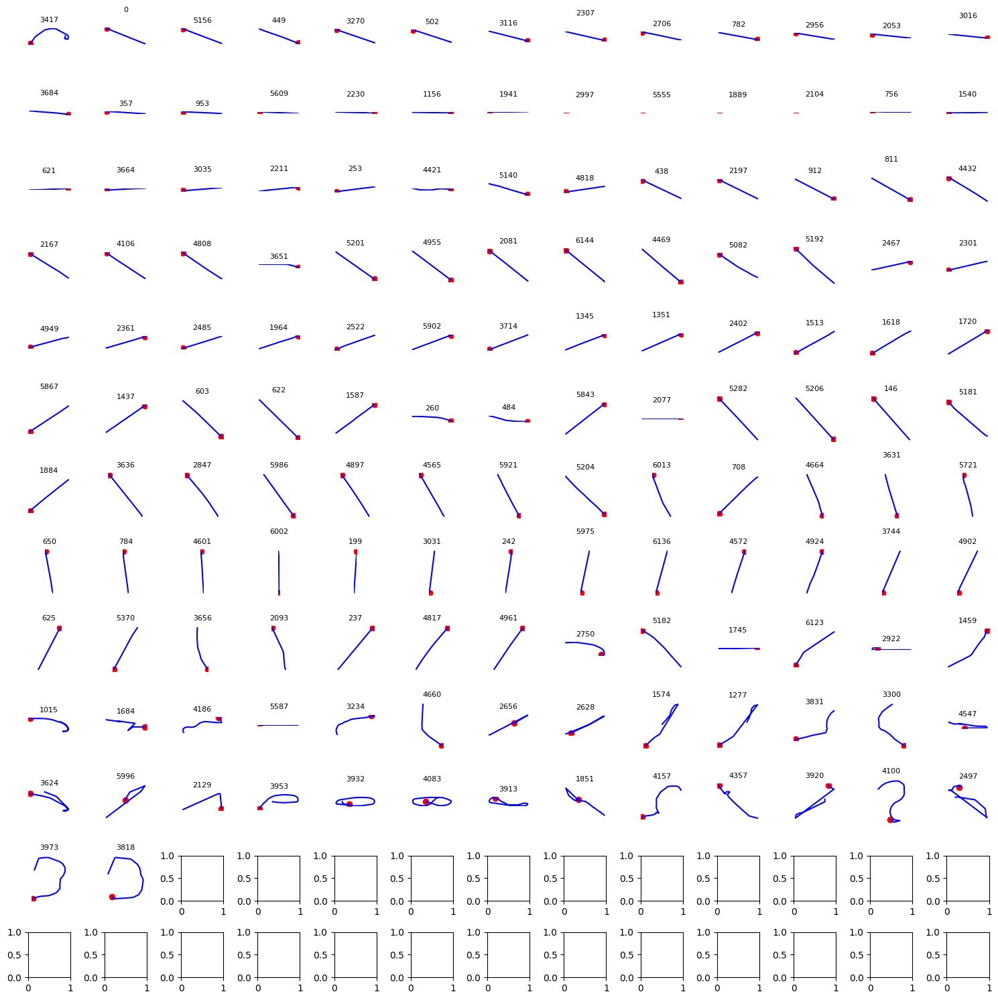

In [184]:
import math

fig, axes = plt.subplots(math.ceil(len(medoids)**.5), math.ceil(len(medoids)**.5), figsize=(15, 15))
axes = axes.flatten()

for ax, (geolet_id, _) in zip(axes, medoids):
    geolet_data = geolets[geolets_keys[geolet_id]]
    ax.plot(geolet_data.longitude, geolet_data.latitude, color='blue')
    ax.scatter(geolet_data.longitude[0], geolet_data.latitude[0], color='red')
    ax.set_title(geolet_id, fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

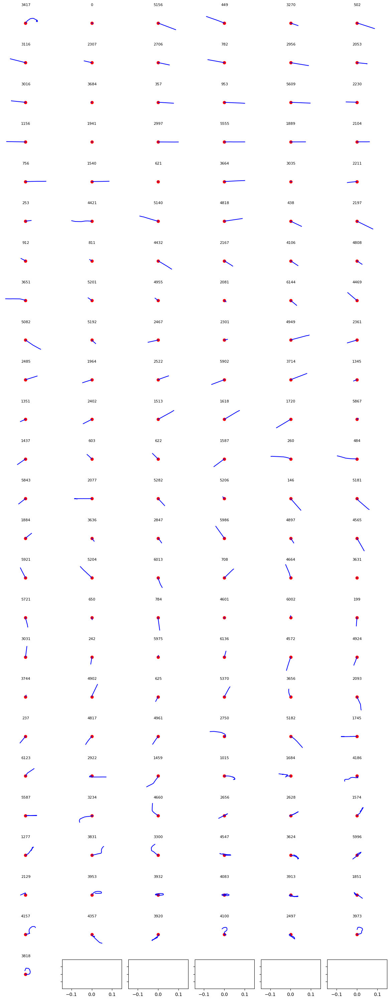

In [185]:
import math

col = 6
row = math.ceil(len(medoids)/col)

fig, axes = plt.subplots(row, col, figsize=(col*2, row*1.2), sharex=True, sharey=True)
axes = axes.flatten()

for ax, (geolet_id, _) in zip(axes, medoids):
    geolet_data = geolets[geolets_keys[geolet_id]]
    ax.plot(geolet_data.longitude - geolet_data.longitude[0], geolet_data.latitude - geolet_data.latitude[0], color='blue')
    ax.scatter([0], [0], color='red')
    ax.set_title(geolet_id, fontsize=8)
    ax.set_aspect('equal')  # stessa scala per x e y
    ax.axis('off')  # opzionale, per rimuovere gli assi

plt.tight_layout()
plt.show()

In [ ]:
from pyclustering.cluster.xmeans import xmeans, kmeans_plusplus_initializer

initial_centers = kmeans_plusplus_initializer(dist_matrix_img, 2).initialize()
xmeans_instance = xmeans(dist_matrix_img, initial_centers, kmax=20)
xmeans_instance.process()
xmeans_clusters = xmeans_instance.get_clusters()

In [ ]:
pip install https://github.com/annoviko/pyclustering/archive/refs/heads/master.zip

In [179]:
def my_hough_transform(points, theta_res=1, rho_res=1):
    thetas = np.deg2rad(np.arange(-90, 90, theta_res))
    width = int(np.ceil(np.sqrt(np.max(points)**2) * 2))
    rhos = np.arange(-width, width, rho_res)
    
    accumulator = np.zeros((len(rhos), len(thetas)), dtype=int)
    
    for x, y in points:
        for t_idx, theta in enumerate(thetas):
            rho = x * np.cos(theta) + y * np.sin(theta)
            r_idx = np.argmin(np.abs(rhos - rho))
            accumulator[r_idx, t_idx] += 1

    return accumulator, thetas, rhos
